Filter Rule: 
1. find the closest point 
2. get the lane direction $$\left(\delta(x),\delta(y)\right)$$
3. get object direction $$\left(\delta(x),\delta(y)\right)$$
4. calculate angle 60 > store it

Tips:
1. calculate angle please normalize delta_value
    - normalization formula : $$\left(\frac{\delta{x}}{\delta{x}+\delta{y}\quad} , \frac{\delta{y}}{\delta{x}+\delta{y}}\quad\right)$$
2. angle formula : 
    
    $$\frac{\vec(a) \cdot \vec(b)}{\|\vec(a)\|\|\vec(b)\|} \quad$$
    
3. arc function get angle

How to Get point
1. find the closest point.
2. set the closest point as start point get the remain point. ex: closest point at pose[5] -> get pose[5:]
3. sample points (depends on resolution)

In [1]:
import matplotlib.pyplot as plt
import tqdm
import numpy as np
import math

from nuscenes.map_expansion.map_api import NuScenesMap
from nuscenes.map_expansion import arcline_path_utils
from nuscenes.map_expansion.bitmap import BitMap

nusc_map = NuScenesMap(dataroot='data/sets/nuscenes', map_name='singapore-onenorth')
bitmap = BitMap(nusc_map.dataroot, nusc_map.map_name, 'basemap')

In [2]:
def get_around_lane(x: float, y: float, radius: float = 5) -> str:
    
        """
        Get lanes id within a radius of query point.
        :param x: X coordinate in global coordinate frame.
        :param y: Y Coordinate in global coordinate frame.
        :param radius: Radius around point to consider.
        :return: Lanes id within radius.
        """
        
        only_lane=[]
        have_lane_connector=[]
        
        lanes = nusc_map.get_records_in_radius(x, y, radius, ['lane', 'lane_connector'])
        lanes = lanes['lane'] + lanes['lane_connector']
        have_lane_connector=have_lane_connector+lanes
        
        return have_lane_connector

In [3]:
def euclideanDistance(p1,p2):
    return math.sqrt(((p1[0]-p2[0])**2)+((p1[1]-p2[1])**2) )

In [4]:
def get_same_direction_lanes(lanes ,point, threshold):
    '''
    remain Lanes which is same direction as agent
    :method calculate the angle between lane direction vector and agent direction vector
    :param point: agent position [2,2] current pos and previous pos
    :param radius: Radius around point to consider.
    :param threshold: interest degree(lane and object direction)
    :return: Lanes id with same direction as agent
    '''

    interest_lane = []
    agent_vector = point[0] - point[1] # get agent direction 0 -> current frame , 1 -> last frame
    
    for i,lane in enumerate(lanes):
        # Get Lane set points
        lane_record = nusc_map.get_arcline_path(lane)
        poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
        poses = np.array(poses)[:,:2] # :2 get x,y coordinate
        
        # using norm1 to get the closest index of lane set points
        delta_pos = poses - point[0] # lane set points subtract current pos
        nearst_point_index = np.argmin(np.sum(np.abs(delta_pos),axis=1))
        
        # if the closest index is last one, get the previous index
        if nearst_point_index == len(poses) - 1:
            next_pt = nearst_point_index
            nearst_point_index = nearst_point_index - 1
        else:
            next_pt = nearst_point_index + 1
        # Get lane vector
        lane_vector = poses[next_pt] - poses[nearst_point_index]
        
        #unitization lane vector and agent vector
        zero = np.zeros(2)
        unit_len = euclideanDistance(agent_vector,zero)
        nor_for_point_vec = np.true_divide(agent_vector,unit_len)
        unit_len = euclideanDistance(lane_vector,zero)
        nor_for_lane_vec = np.true_divide(lane_vector,unit_len)
    
        # inner product -> cos value (after unitization)
        inner_product=np.dot(nor_for_point_vec, nor_for_lane_vec)

        # get the degree
        angle = np.degrees(np.arccos(inner_product))

        if angle < threshold:
            interest_lane.append(lanes[i])
            
    return interest_lane

In [5]:
def get_future_lanes(lane_list,point):
    '''
    filter out the travaled lane
    :param lane_list: Lanes id with same direction as agent
    :param point: agent position [2,2] 0->current pos and 1->previous pos
    :return: Lanes id with same direction and in front of agent
    '''
            
    final_lane=[]
    
    # using 2 point to get a line in 2d plane(y = ax+b)
    a = 0 if point[0][0]==point[1][0] else (point[0][1]-point[1][1])/(point[0][0]-point[1][0])
    b = point[0][1] - a*point[0][0]
    
    # two orthogonal line the product of slopes will be -1
    a1 = 0 if a==0 else -1.0/a
    b1 = point[1][1] - a1*point[1][0]
    
    # Determine the region of point (1 line divide a plane into 2 region)
    agent_flag = False if point[0][1] - a1*point[0][0] - b1 < 0 else True

    for i,lane in enumerate(lane_list):
        
        # Get lane points
        lane_record = nusc_map.get_arcline_path(lane)
        poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
        poses = np.array(poses)[:,:2]
        
        # using norm1 to get the closest index of lane set points
        delta_pos = poses - point[0]
        nearst_point_index = np.argmin(np.sum(np.abs(delta_pos),axis=1))
        
        # Determine the region of point (1 line divide a plane into 2 region)
        lane_flag = False if poses[nearst_point_index][1]-a1*poses[nearst_point_index][0]-b1 < 0 else True
        
        if lane_flag==agent_flag:
            final_lane.append(lane)      
    
    return final_lane

In [13]:
def get_nearest_lane(lane_list,point):
    '''
    get closest right middle left lanes
    :param lane_list: Lanes id with same direction as agent
    :param point: agent position [2,2] 0->current pos and 1->previous pos
    :return: right middle left lanes id
    '''
    # using 2 point to get a line in 2d plane(y = ax+b)
    a = 0 if point[0][0] == point[1][0] else (point[0][1] - point[1][1])/(point[0][0] - point[1][0])
    b = point[0][1] - a*point[0][0]
    
    # init parameter
    max_number=-999
    min_number=1000
    temp_for_max=0
    temp_for_min=0
    nearst_lane=[]
    
    # get middle lane (assume the closest lane is middle lane)
    closest_lane = nusc_map.get_closest_lane(point[0][0], point[0][1], radius=radius)
    out_going=str(nusc_map.get_outgoing_lane_ids(closest_lane)).replace("['","").replace("']","")
    
    lane_list.remove(closest_lane)
    if out_going in lane_list:
        lane_list.remove(out_going)
    
    for i,lane in enumerate(lane_list):
        # Get lane points
        lane_record = nusc_map.get_arcline_path(lane)
        poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
        poses = np.array(poses)[:,:2]
        
        # using norm1 to get the closest index of lane set points
        delta_pos = poses - point[0]
        nearst_point_index = np.argmin(np.sum(np.abs(delta_pos),axis=1))
        
        # Determine the closest lane at the specific region (right or left)
        num=a*poses[nearst_point_index][0]+b-poses[nearst_point_index][1]
        if num < 0 and num < min_number:
            min_number=num
            temp_for_min=i
        if num > 0 and num > max_number: 
            max_number=num
            temp_for_max=i
        
    if max_number != -999:
        nearst_lane.append(lane_list[temp_for_max])
    nearst_lane.append(closest_lane)
    if min_number != 1000:
        nearst_lane.append(lane_list[temp_for_min])
        
    return nearst_lane

get_around_lane : 
 ['594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f', '919162be-8b6c-45f7-a626-ae752c288166', 'f3b46160-57ff-4d83-b607-0380332a2dbc', '1d50e506-350b-4982-9841-38e7f6fa9007', '795693a1-380d-45aa-928c-5ab1d6723f79', '794f1e67-b6b2-4709-aff2-254059095e96', '7cc63cbc-c60a-4550-bc89-499ce4006a1a']
get_same_direction_lanes : 
 ['594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f', 'f3b46160-57ff-4d83-b607-0380332a2dbc', '7cc63cbc-c60a-4550-bc89-499ce4006a1a']
get_future_lanes : 
 ['594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f', 'f3b46160-57ff-4d83-b607-0380332a2dbc', '7cc63cbc-c60a-4550-bc89-499ce4006a1a']
num: -5.155070465240669
num: -5.0453769234220545
get_nearest_lane : 
 ['f3b46160-57ff-4d83-b607-0380332a2dbc', '594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f']


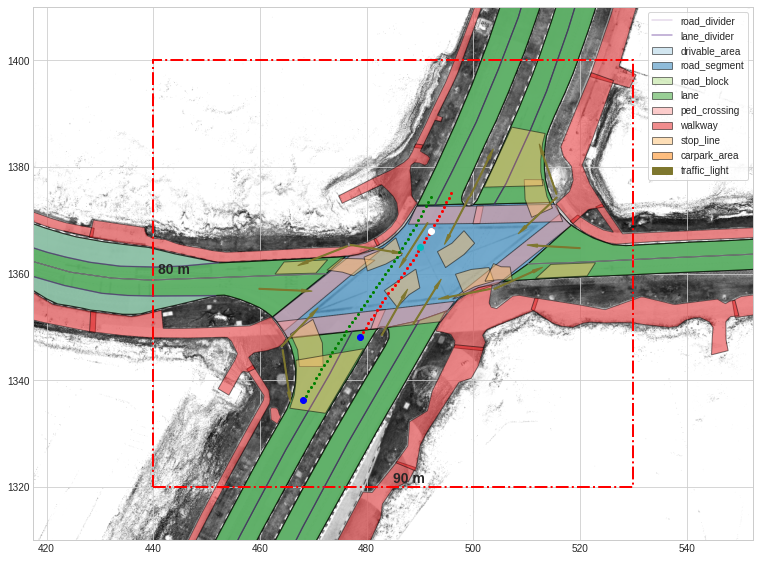

In [7]:
my_patch = (440, 1320, 530, 1400)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

point = np.array([[492,1368],[490,1365]])
radius = 4
threshold = 20
color = ['r','g','c','m','y','k','gold','lime']

lanes = get_around_lane(point[0][0], point[0][1], radius=1)
print("get_around_lane : \n",lanes)
lanes = get_same_direction_lanes(lanes, point, threshold)
print("get_same_direction_lanes : \n",lanes)
lanes = get_future_lanes(lanes, point)
print("get_future_lanes : \n",lanes)
lanes = get_nearest_lane(lanes, point) 
print("get_nearest_lane : \n",lanes)

for i,lane in enumerfeature_lane_pointate(lanes):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:feature_lane_point
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1][0], point[1][1],'co') #青色實心(前一幀)          
ax.plot(point[0][0], point[0][1],'wo') #白色實心(現在)

In [ ]:
def find_future_80m_lane(start_lanes):
    start_lane_sets = []
    feature_lanes = []
    #取car_pos後的點
    for i,start_lane in enumerate(start_lanes):
        #print("ID:",start_lane)
        start_lane_record = nusc_map.get_arcline_path(start_lane)
        poses = arcline_path_utils.discretize_lane(start_lane_record, resolution_meters=5)
        car_pos = np.array((point[0,0], point[0,1], 0)) 
        dist2car = []
        for k,pose in enumerate(poses):
            temp = car_pos - pose
            dist2car.append(np.sqrt(np.dot(temp.T, temp))) 
        tmp = min(dist2car)
        index = dist2car.index(tmp)
        lane = []
        start_lane_set = poses[index+1:]
        #取一開始的lane就有16個點了
        if len(start_lane_set) >= 16:
            lane = start_lane_set[:16]
            
        #表示整條路徑都在自車之後，不取start_lane_set，直接往下延伸去取
        
        elif len(start_lane_set) <=1 :
            next_x = poses[len(poses)-1][0] + (poses[len(poses)-1][0] - poses[len(poses)-2][0])
            next_y = poses[len(poses)-1][1] + (poses[len(poses)-1][1] - poses[len(poses)-2][1])
            next_lane = nusc_map.get_closest_lane(next_x, next_y, radius=100)
            next_lane_record = nusc_map.get_arcline_path(next_lane)
            pose = arcline_path_utils.discretize_lane(next_lane_record, resolution_meters=5)
            lane = pose
            if len(lane) >= 16:
                lane = lane[:16]
            else :
                while len(lane) < 16 :  
                    next_x = lane[len(lane)-1][0] + (lane[len(lane)-1][0] - lane[len(lane)-2][0])
                    next_y = lane[len(lane)-1][1] + (lane[len(lane)-1][1] - lane[len(lane)-2][1])
                    next_lane = nusc_map.get_closest_lane(next_x, next_y, radius=100)
                    next_lane_record = nusc_map.get_arcline_path(next_lane)
                    pose = arcline_path_utils.discretize_lane(next_lane_record, resolution_meters=5)
                    for j in range(len(pose)):
                        lane.append((pose[j][0],pose[j][1],pose[j][2]))
                    if len(lane) > 16:
                        lane = lane[:16]
        #取一開始的lane不足16的點，往下延伸
        elif 1 < len(start_lane_set) and len(start_lane_set) < 16:
            lane = start_lane_set
            while len(lane) < 16 :           
                #print("lane:",lane)
                #print("lane_len:",len(lane))
                next_x = lane[len(lane)-1][0] + (lane[len(lane)-1][0] - lane[len(lane)-2][0])
                next_y = lane[len(lane)-1][1] + (lane[len(lane)-1][1] - lane[len(lane)-2][1])
                #print("nx:",next_x,"ny:",next_y)
                next_lane = nusc_map.get_closest_lane(next_x, next_y, radius=100)
                next_lane_record = nusc_map.get_arcline_path(next_lane)
                pose = arcline_path_utils.discretize_lane(next_lane_record, resolution_meters=5)
                #poses = find_lane_set(next_x,next_y,5)
                for j in range(len(pose)):
                    lane.append((pose[j][0],pose[j][1],pose[j][2]))
                if len(lane) >= 16:
                    lane = lane[:16]
        feature_lanes.append(lane)
    return feature_lanes

"""
共測試五個場景
"""

第一個場景：my_patch = (440, 1320, 530, 1400)

第二個場景：my_patch = (440, 1320, 530, 1400)

第三個場景：my_patch = (710, 600, 800, 800)

第四個場景：my_patch = (300, 1075, 450, 1175)

第五個場景：my_patch = (760, 1690, 790 , 1750)


第一個場景測試：

當前point(492,1368)

前一point(490,1365)

get_around_lane : 
 ['594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f', '919162be-8b6c-45f7-a626-ae752c288166', 'f3b46160-57ff-4d83-b607-0380332a2dbc', '1d50e506-350b-4982-9841-38e7f6fa9007', '795693a1-380d-45aa-928c-5ab1d6723f79', '794f1e67-b6b2-4709-aff2-254059095e96', '7cc63cbc-c60a-4550-bc89-499ce4006a1a']
get_same_direction_lanes : 
 ['594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f', 'f3b46160-57ff-4d83-b607-0380332a2dbc', '7cc63cbc-c60a-4550-bc89-499ce4006a1a']
get_future_lanes : 
 ['594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f', 'f3b46160-57ff-4d83-b607-0380332a2dbc', '7cc63cbc-c60a-4550-bc89-499ce4006a1a']
get_nearest_lane : 
 ['f3b46160-57ff-4d83-b607-0380332a2dbc', '594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f']


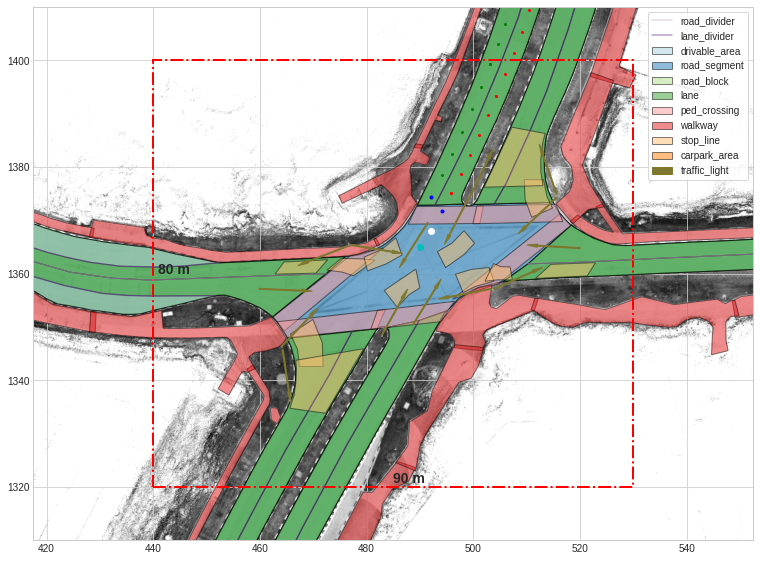

In [14]:
my_patch = (440, 1320, 530, 1400)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

point = np.array([[492,1368],[490,1365]])
radius = 4
threshold = 20
color = ['r','g','c','m','y','k','gold','lime']

lanes = get_around_lane(point[0][0], point[0][1], radius=1)
print("get_around_lane : \n",lanes)
lanes = get_same_direction_lanes(lanes, point, threshold)
print("get_same_direction_lanes : \n",lanes)
lanes = get_future_lanes(lanes, point)
print("get_future_lanes : \n",lanes)
lanes = get_nearest_lane(lanes, point) 
print("get_nearest_lane : \n",lanes)
future_nearest_lanes = find_future_80m_lane(lanes)

for i, feature_lane in enumerate(future_nearest_lanes):
    clr = color[i]
    for j, feature_lane_point in enumerate(feature_lane):
        if not j :
            ax.plot(feature_lane_point[0], feature_lane_point[1],'bo', markersize=3) # start_pose
        else:
            ax.plot(feature_lane_point[0], feature_lane_point[1], c=clr, marker='o', markersize=2) # remain_pose
      
ax.plot(point[1][0], point[1][1],'co') #青色實心(前一幀)          
ax.plot(point[0][0], point[0][1],'wo') #白色實心(現在)

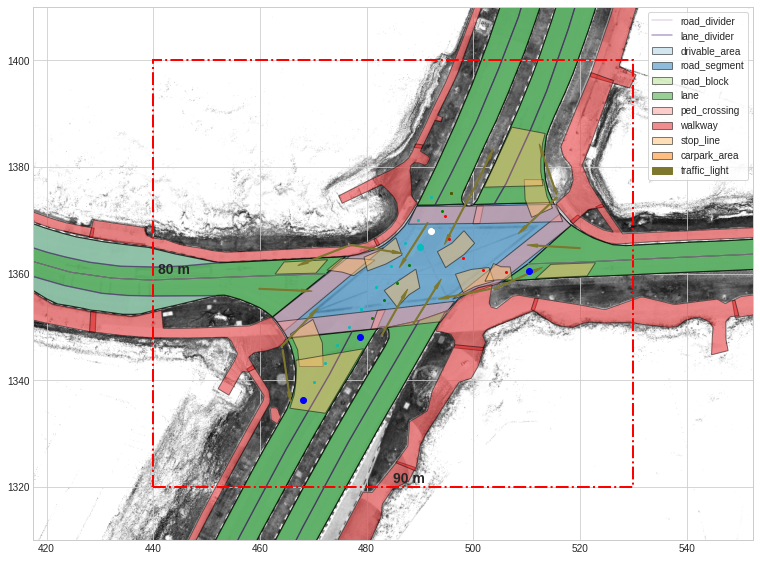

In [ ]:
my_patch = (440, 1320, 530, 1400)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=490
#past_y=1365
#now_x=492
#now_y=1368

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=2)
#print(lanes)
direct_tensor = None
for i,lane in enumerate(nearest_3_lane):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=5)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

In [ ]:
future_nearest_3_lane=find_future_80m_lane(nearest_3_lane)
print(future_nearest_3_lane)

[[(495.84030452532136, 1375.0414842550217, 1.0971285078063282), (497.6534359660269, 1378.654581055713, 1.11425586262534), (499.4044217101181, 1382.2982005523713, 1.1313832174443519), (501.0927481249914, 1385.9712739288889, 1.1485105722633637), (502.7179199584752, 1389.6727237291823, 1.1656379270823747), (504.28983500836347, 1393.397144553626, 1.17300727012816), (504.2898350083634, 1393.397144553626, 1.17300727012816), (505.9517014628408, 1397.3535129990332, 1.175283670263127), (507.56204460883157, 1401.3310411713326, 1.1969305156527552), (509.08591626424135, 1405.3424935999565, 1.2185773610423833), (510.5226023921585, 1409.3859906481962, 1.2402242064320124), (511.8714298079865, 1413.4596376642721, 1.2618710518216396), (511.87142980798654, 1413.4596376642721, 1.2618710518216396), (513.0501192889735, 1417.3093054157478, 1.2854887896670704), (514.1375680587452, 1421.1857349407699, 1.3091065275125002), (515.1331695692467, 1425.0867640769889, 1.33272426535793)], [(494.073595342253, 1371.657

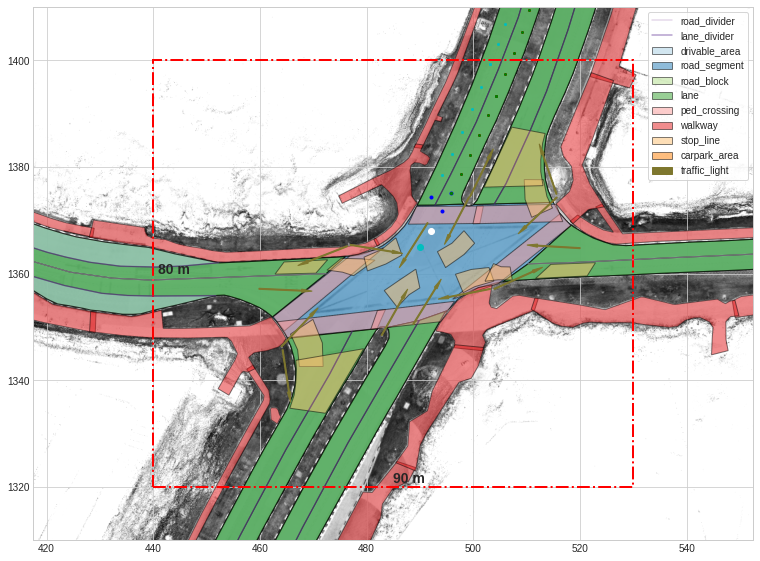

In [167]:
my_patch = (440, 1320, 530, 1400)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=490
#past_y=1365
#now_x=492
#now_y=1368

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=1)
#print(lanes)
direct_tensor = None
for i,feature_lane in enumerate(future_nearest_3_lane):
    clr = color[i]
    for j,feature_lane_point in enumerate(feature_lane):
        if not j :
            ax.plot(feature_lane_point[0],feature_lane_point[1],'bo',markersize=3) # start_pose
        else:
            ax.plot(feature_lane_point[0],feature_lane_point[1],c=clr,marker='o',markersize=2) # remain_pose
#ax.plot(492.0430031039708, 1374.355528536297,'yo')
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

第二個場景測試：

當前point(775,760)

前一point(774,764)

['7453644e-3853-4fa8-b0f2-bc275376a2b3', 'bfc40157-0210-407a-9267-bcdf623bb8a0', '90f074fc-451d-4e03-a027-b8f11260ef7e', 'd348f5f0-6b75-4f44-90bc-3a7549f0da11']


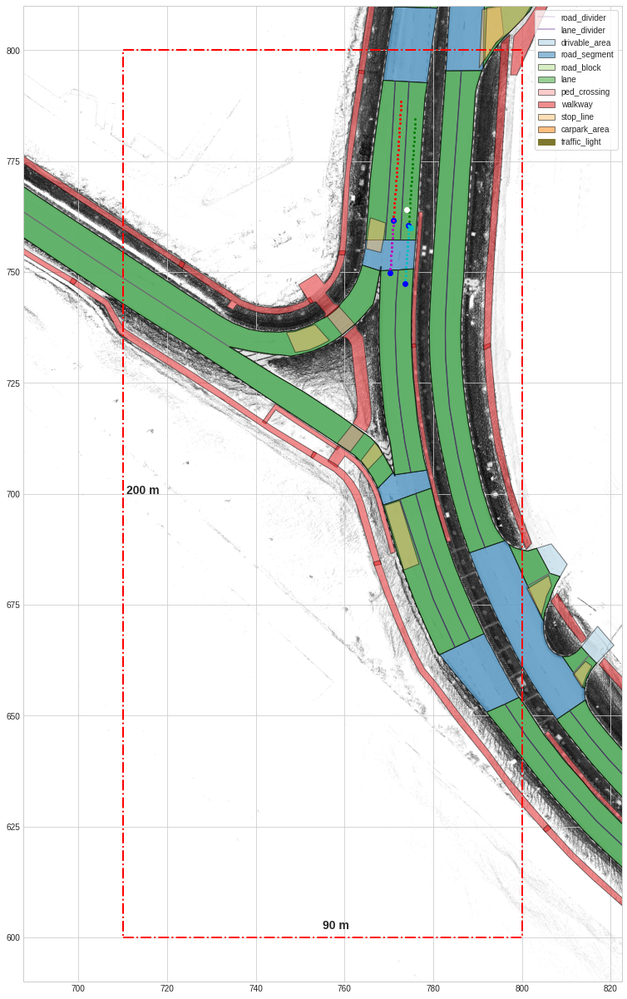

In [14]:
my_patch = (710, 600, 800, 800)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

past_x=775
past_y=760
now_x=774
now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(now_x,now_y, radius=2)
print(lanes)
direct_tensor = None
for i,lane in enumerate(lanes):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose

ax.plot(past_x, past_y,'co') #青色實心(前一幀) 
ax.plot(now_x, now_y,'wo') #白色實心(現在)

In [143]:
point = np.zeros(shape=(2,2))
##當前point
point[0,0]=774
point[0,1]=764
##前一個point
point[1,0]=775
point[1,1]=760
point

array([[774., 764.],
       [775., 760.]])

In [144]:
same_dir_lane=get_same_direction_of_point(point,2)
print(same_dir_lane)

lane: 7453644e-3853-4fa8-b0f2-bc275376a2b3
inner_product: 0.9523275237826458
angle: 17.76282718639408
lane: bfc40157-0210-407a-9267-bcdf623bb8a0
inner_product: 0.9534805446363587
angle: 17.544988254637616
lane: 90f074fc-451d-4e03-a027-b8f11260ef7e
inner_product: 0.9534805363375476
angle: 17.544989831946086
lane: d348f5f0-6b75-4f44-90bc-3a7549f0da11
inner_product: 0.9524774662193544
angle: 17.73464526766245
['7453644e-3853-4fa8-b0f2-bc275376a2b3', 'bfc40157-0210-407a-9267-bcdf623bb8a0', '90f074fc-451d-4e03-a027-b8f11260ef7e', 'd348f5f0-6b75-4f44-90bc-3a7549f0da11']


['7453644e-3853-4fa8-b0f2-bc275376a2b3', 'bfc40157-0210-407a-9267-bcdf623bb8a0', '90f074fc-451d-4e03-a027-b8f11260ef7e', 'd348f5f0-6b75-4f44-90bc-3a7549f0da11']


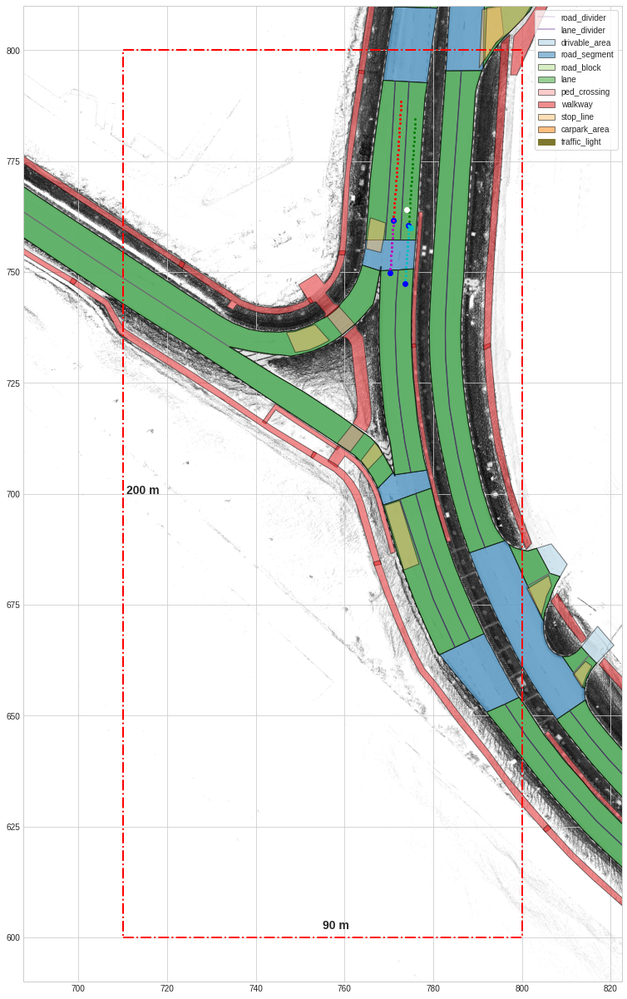

In [196]:
my_patch = (710, 600, 800, 800)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

past_x=775
past_y=760
now_x=774
now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(now_x,now_y, radius=2)
print(lanes)
direct_tensor = None
for i,lane in enumerate(same_dir_lane):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(past_x, past_y,'co') #青色實心(前一幀)          
ax.plot(now_x, now_y,'wo') #白色實心(現在)

In [145]:
hello=delt_past_lane(same_dir_lane,point,2)
print(hello)

['7453644e-3853-4fa8-b0f2-bc275376a2b3', 'bfc40157-0210-407a-9267-bcdf623bb8a0', '90f074fc-451d-4e03-a027-b8f11260ef7e', 'd348f5f0-6b75-4f44-90bc-3a7549f0da11']


['7453644e-3853-4fa8-b0f2-bc275376a2b3', 'bfc40157-0210-407a-9267-bcdf623bb8a0', 'd348f5f0-6b75-4f44-90bc-3a7549f0da11']


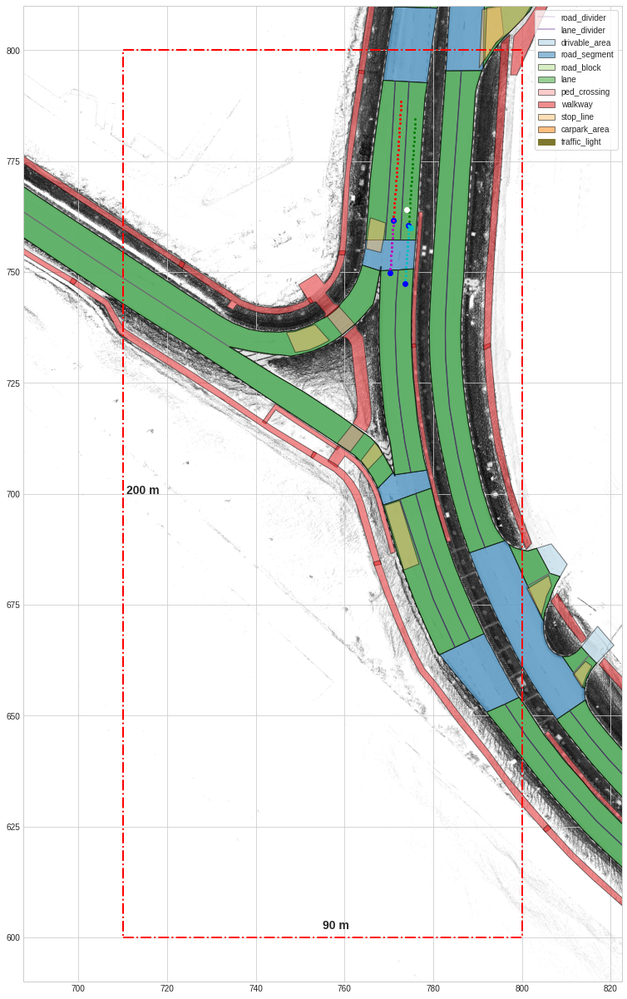

In [71]:
my_patch = (710, 600, 800, 800)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=775
#past_y=760
#now_x=774
#now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=1)
print(lanes)
direct_tensor = None
for i,lane in enumerate(hello):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)


In [146]:
nearest_3_lane=get_nearest_3_lane_hello(hello,point,2)
print(nearest_3_lane)

lane: 7453644e-3853-4fa8-b0f2-bc275376a2b3
num: 11.785651552414492
lane: 90f074fc-451d-4e03-a027-b8f11260ef7e
num: 1.6123810264823533
lane: d348f5f0-6b75-4f44-90bc-3a7549f0da11
num: 14.296925210706718
bfc40157-0210-407a-9267-bcdf623bb8a0
nearst_lane: ['d348f5f0-6b75-4f44-90bc-3a7549f0da11', 'bfc40157-0210-407a-9267-bcdf623bb8a0']
['d348f5f0-6b75-4f44-90bc-3a7549f0da11', 'bfc40157-0210-407a-9267-bcdf623bb8a0']


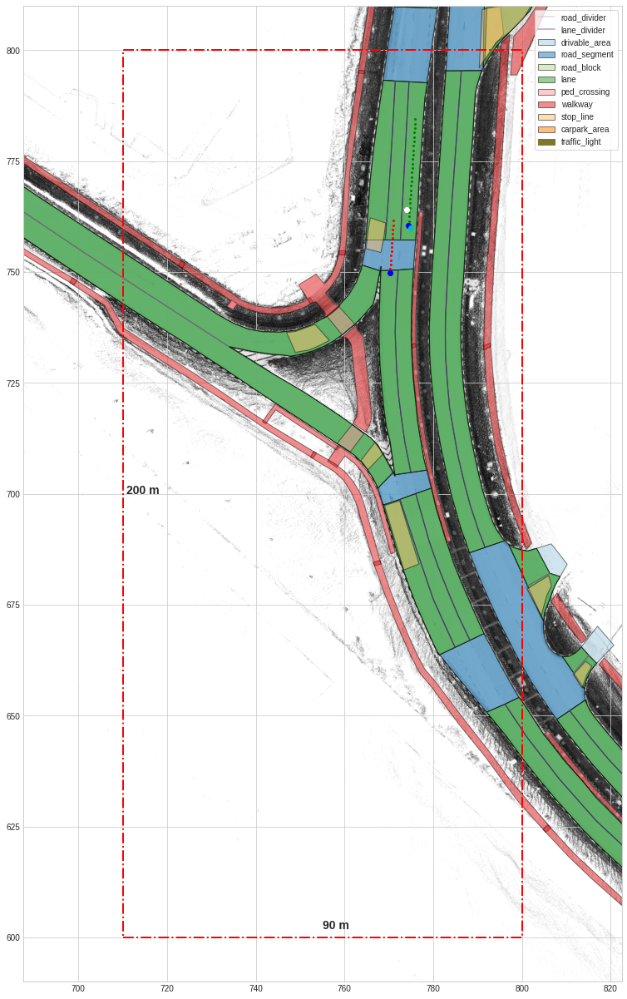

In [73]:
my_patch = (710, 600, 800, 800)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=490
#past_y=1365
#now_x=492
#now_y=1368

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=2)
#print(lanes)
direct_tensor = None
for i,lane in enumerate(nearest_3_lane):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

In [147]:
future_nearest_3_lane=find_future_80m_lane(nearest_3_lane)
print(future_nearest_3_lane)

[[(771.0343950720555, 761.5654945010709, 1.5057526241616515), (771.326355445757, 766.0480187215036, 1.5057551710564248), (771.618315816222, 770.530542942147, 1.5057551710564248), (771.9102761866869, 775.0130671627904, 1.5057551710564248), (772.2022365571518, 779.4955913834339, 1.5057551710564248), (772.4941969276167, 783.9781156040773, 1.5057551710564248), (772.7861573014615, 788.4606398245006, 1.5057525683445583), (772.7861573014617, 788.4606398245015, 1.5057525683445583), (773.1059176322477, 793.3697852291422, 1.5057525683471855), (773.4256779630336, 798.2789306337828, 1.5057525683471855), (773.7454382938197, 803.1880760384233, 1.5057525683471855), (774.0651986246056, 808.097221443064, 1.5057525683471855), (774.3848950651698, 813.0063709975736, 1.506297828987253), (774.3848950651696, 813.0063709975738, 1.5062978289872522), (774.6887286339635, 817.2697522005242, 1.49300365066751), (775.0459836758109, 821.5290020939354, 1.4860585370962642)], [(775.0640274974116, 770.0503752738673, 1.50

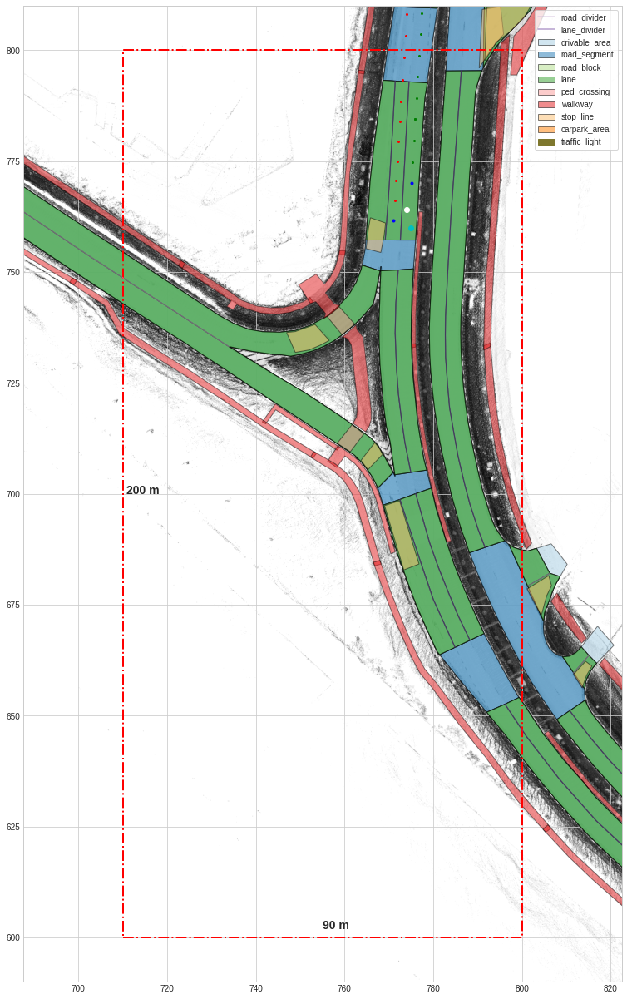

In [148]:
my_patch = (710, 600, 800, 800)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=490
#past_y=1365
#now_x=492
#now_y=1368

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=1)
#print(lanes)
direct_tensor = None
for i,feature_lane in enumerate(future_nearest_3_lane):
    clr = color[i]
    for j,feature_lane_point in enumerate(feature_lane):
        if not j :
            ax.plot(feature_lane_point[0],feature_lane_point[1],'bo',markersize=3) # start_pose
        else:
            ax.plot(feature_lane_point[0],feature_lane_point[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

第三個場景測試：

當前point(821,1300)

前一point(821,1297)

['7498f53c-84f9-4c80-933a-a96e87358cec', '79de4015-623b-4d9c-b387-fe2f390cff86', 'ead24b75-a436-4814-90c4-6f2fa73dedf7', '645ed1ba-d46c-40a0-a43f-274c35335df5', '4f2719a3-c740-4dd3-9b88-458fcf34cc46', '7a419642-f630-499a-a891-f45f7eb7c995', '4de05887-b4b8-48b9-84b5-9d79cc319cc3']


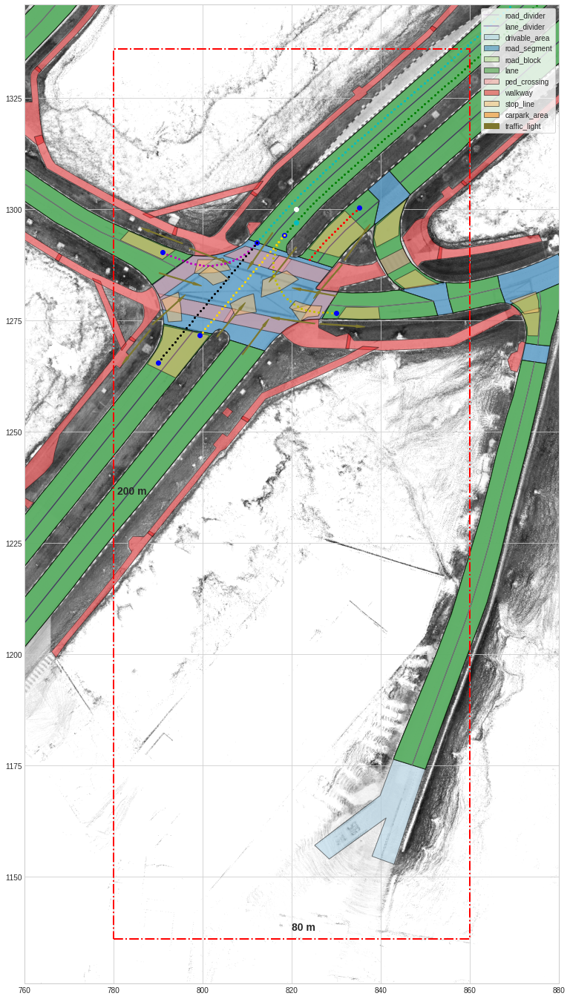

In [164]:
my_patch = (780, 1136, 860, 1336)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

past_x=821
past_y=1297
now_x=821
now_y=1300

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(now_x,now_y, radius=7)
print(lanes)
direct_tensor = None
for i,lane in enumerate(lanes):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(past_x, past_y,'co') #青色實心(前一幀)          
ax.plot(now_x, now_y,'wo') #白色實心(現在)

In [149]:
point = np.zeros(shape=(2,2))
##當前point
point[0,0]=821
point[0,1]=1300
##前一個point
point[1,0]=821
point[1,1]=1297
point

array([[ 821., 1300.],
       [ 821., 1297.]])

In [150]:
same_dir_lane=get_same_direction_of_point(point,7)
print(same_dir_lane)

lane: 7498f53c-84f9-4c80-933a-a96e87358cec
inner_product: -0.7073237277901474
angle: 135.01758154880304
lane: 79de4015-623b-4d9c-b387-fe2f390cff86
inner_product: 0.7154625357699986
angle: 44.31888152212579
lane: ead24b75-a436-4814-90c4-6f2fa73dedf7
inner_product: 0.7251135211658005
angle: 43.521707726335414
lane: 645ed1ba-d46c-40a0-a43f-274c35335df5
inner_product: 0.7490336903626829
angle: 41.49325763740196
lane: 4f2719a3-c740-4dd3-9b88-458fcf34cc46
inner_product: 0.7881450570321489
angle: 37.98749947106564
lane: 7a419642-f630-499a-a891-f45f7eb7c995
inner_product: 0.7710683313078579
angle: 39.550078767429106
lane: 4de05887-b4b8-48b9-84b5-9d79cc319cc3
inner_product: 0.7655010862641444
angle: 40.04840851358184
['79de4015-623b-4d9c-b387-fe2f390cff86', 'ead24b75-a436-4814-90c4-6f2fa73dedf7', '645ed1ba-d46c-40a0-a43f-274c35335df5', '4f2719a3-c740-4dd3-9b88-458fcf34cc46', '7a419642-f630-499a-a891-f45f7eb7c995', '4de05887-b4b8-48b9-84b5-9d79cc319cc3']


['019c6ebf-278f-482e-ad63-f53c3bbfb7f7', '034011e2-8169-4f13-9c97-dec18df450b8', '594d53a6-35d6-44f2-9ed3-cf74e6a7dd3f', '7ad26b17-9aa5-4a35-9612-33678fccb087', '919162be-8b6c-45f7-a626-ae752c288166', '00645d3e-0ab6-49dd-96c2-d499232d219f', 'eb75fe65-6d65-4539-aa10-c76e8a07bf7e', 'f3b46160-57ff-4d83-b607-0380332a2dbc', 'd73efb02-5567-4485-bfc8-98d061c8a2fd', '20b38bd6-c182-4dda-a584-9d47d0dd3710', '1d50e506-350b-4982-9841-38e7f6fa9007', '795693a1-380d-45aa-928c-5ab1d6723f79', '794f1e67-b6b2-4709-aff2-254059095e96', '7cc63cbc-c60a-4550-bc89-499ce4006a1a']


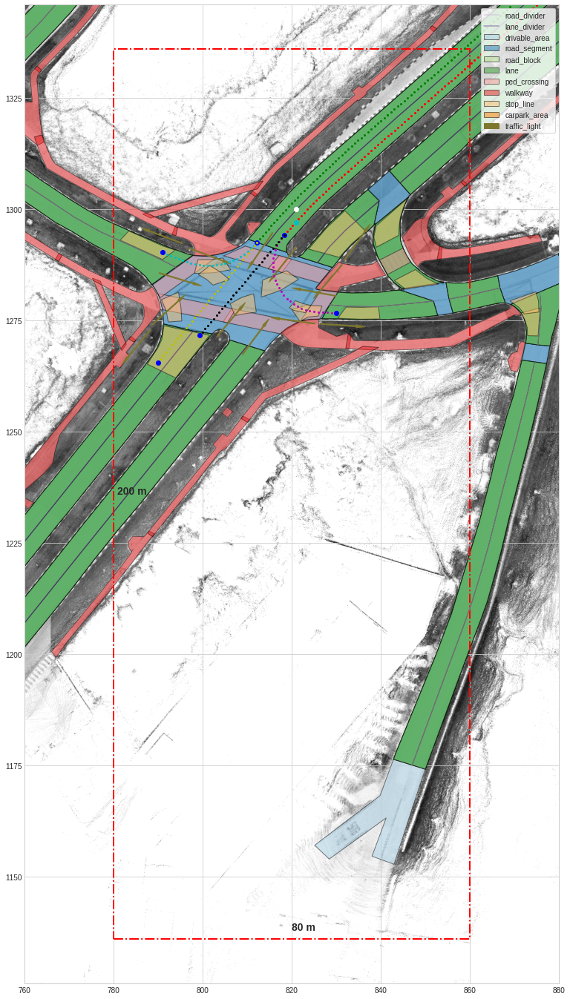

In [151]:
my_patch = (780, 1136, 860, 1336)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=775
#past_y=760
#now_x=774
#now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(now_x,now_y, radius=7)
print(lanes)
direct_tensor = None
for i,lane in enumerate(same_dir_lane):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

In [152]:
hello=delt_past_lane(same_dir_lane,point,7)
print(hello)

['79de4015-623b-4d9c-b387-fe2f390cff86', 'ead24b75-a436-4814-90c4-6f2fa73dedf7']


['7498f53c-84f9-4c80-933a-a96e87358cec', '79de4015-623b-4d9c-b387-fe2f390cff86', 'ead24b75-a436-4814-90c4-6f2fa73dedf7', '645ed1ba-d46c-40a0-a43f-274c35335df5', '4f2719a3-c740-4dd3-9b88-458fcf34cc46', '7a419642-f630-499a-a891-f45f7eb7c995', '4de05887-b4b8-48b9-84b5-9d79cc319cc3']


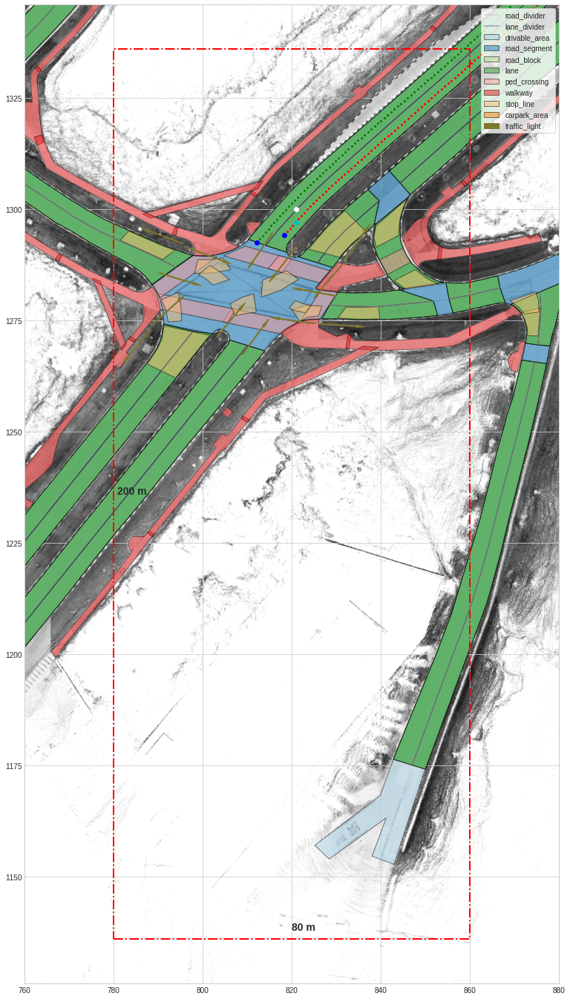

In [207]:
my_patch = (780, 1136, 860, 1336)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=775
#past_y=760
#now_x=774
#now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=7)
print(lanes)
direct_tensor = None
for i,lane in enumerate(hello):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

In [153]:
nearest_3_lane=get_nearest_3_lane_hello(hello,point,7)
print(nearest_3_lane)



lane: 79de4015-623b-4d9c-b387-fe2f390cff86
num: 0.023307933830665206
ead24b75-a436-4814-90c4-6f2fa73dedf7
nearst_lane: ['79de4015-623b-4d9c-b387-fe2f390cff86', 'ead24b75-a436-4814-90c4-6f2fa73dedf7']
['79de4015-623b-4d9c-b387-fe2f390cff86', 'ead24b75-a436-4814-90c4-6f2fa73dedf7']


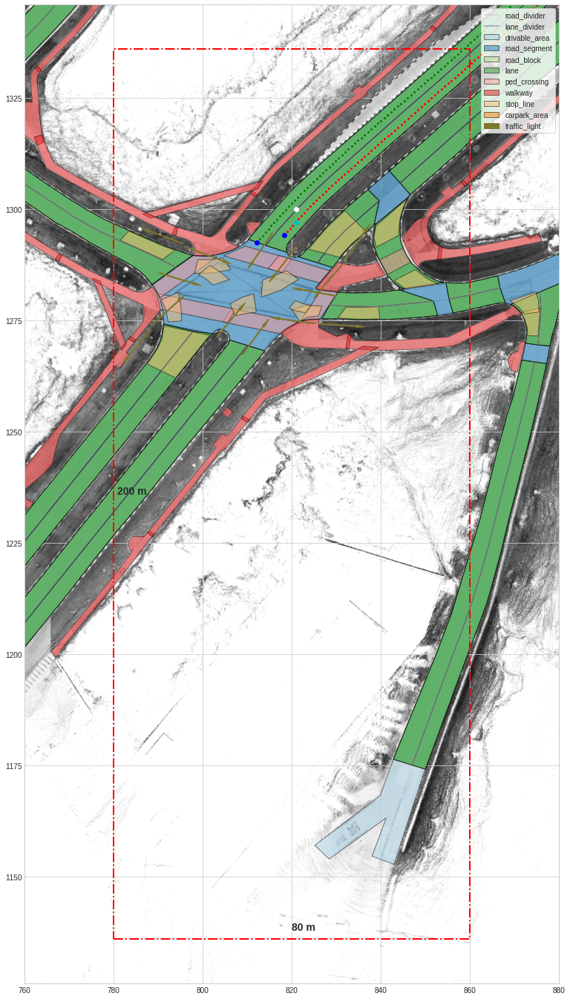

In [209]:
my_patch = (780, 1136, 860, 1336)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=490
#past_y=1365
#now_x=492
#now_y=1368

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=1)
#print(lanes)
direct_tensor = None
for i,lane in enumerate(nearest_3_lane):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

第四個場景測試：

當前point(375,1132)

前一point(375,1130)

['d6f48dbf-3377-4e3a-9d1d-36c6dce63600', '092b05cd-12bd-4b45-ab0c-510c886fa06b', 'fea4c05c-c4ce-499d-8bd9-9070f080eb70', 'c119fed8-400d-486a-93a0-6738464a3680', '6f489965-2ef5-4299-aa17-9a5bcf4e3d2a', '2be79e09-f17d-4570-aa75-5c1c098d6afd', '349bd97f-67bc-4f5d-92cb-8f1fb9551767', '5e479fe8-4129-4ae1-a80c-70f19fd637d6']


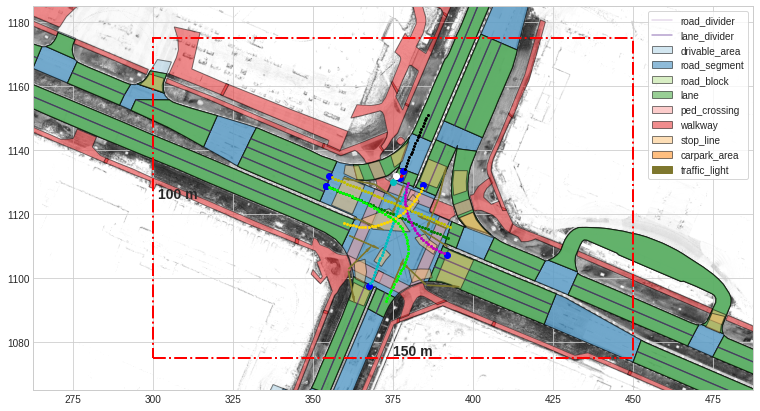

In [177]:
my_patch = (300, 1075, 450, 1175)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

past_x=375
past_y=1130
now_x=376
now_y=1132

color = ['r','g','c','m','y','k','gold','lime','b']
lanes = get_around_lane(now_x,now_y, radius=1)
print(lanes)
direct_tensor = None
for i,lane in enumerate(lanes):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(past_x, past_y,'co') #青色實心(前一幀)          
ax.plot(now_x, now_y,'wo') #白色實心(現在)

In [210]:
point = np.zeros(shape=(2,2))
##當前point
point[0,0]=376
point[0,1]=1132
##前一個point
point[1,0]=375
point[1,1]=1130
point

array([[ 376., 1132.],
       [ 375., 1130.]])

In [211]:
same_dir_lane=get_same_direction_of_point(point,1)
print(same_dir_lane)

lane: d6f48dbf-3377-4e3a-9d1d-36c6dce63600
inner_product: 0.9984072213650735
angle: 3.2342456480467567
lane: 092b05cd-12bd-4b45-ab0c-510c886fa06b
inner_product: 0.05440240498329062
angle: 86.88143221037605
lane: fea4c05c-c4ce-499d-8bd9-9070f080eb70
inner_product: 0.9973323056341116
angle: 4.186029266371141
lane: c119fed8-400d-486a-93a0-6738464a3680
inner_product: 0.9951328799565199
angle: 5.65522597639843
lane: 6f489965-2ef5-4299-aa17-9a5bcf4e3d2a
inner_product: 0.06657311989784795
angle: 86.18281803954345
lane: 2be79e09-f17d-4570-aa75-5c1c098d6afd
inner_product: 0.998379927161533
angle: 3.261846731818883
lane: 349bd97f-67bc-4f5d-92cb-8f1fb9551767
inner_product: -0.9981747869746944
angle: 176.5377335393678
lane: 5e479fe8-4129-4ae1-a80c-70f19fd637d6
inner_product: -0.2978399467524018
angle: 107.3279114142346
['d6f48dbf-3377-4e3a-9d1d-36c6dce63600', 'fea4c05c-c4ce-499d-8bd9-9070f080eb70', 'c119fed8-400d-486a-93a0-6738464a3680', '2be79e09-f17d-4570-aa75-5c1c098d6afd']


['7453644e-3853-4fa8-b0f2-bc275376a2b3', 'bfc40157-0210-407a-9267-bcdf623bb8a0', 'd348f5f0-6b75-4f44-90bc-3a7549f0da11']


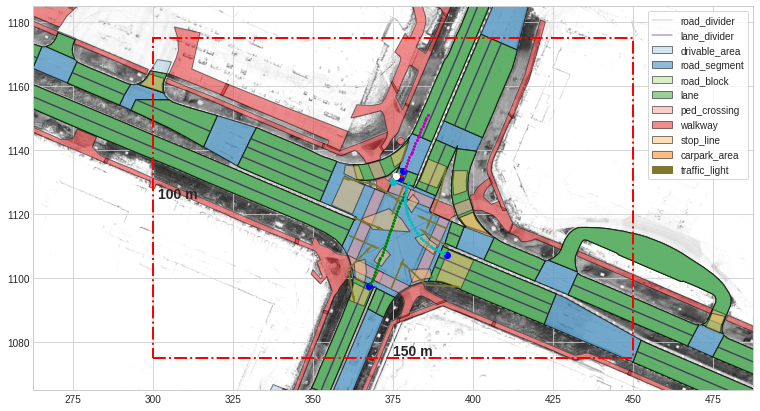

In [212]:
my_patch = (300, 1075, 450, 1175)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=775
#past_y=760
#now_x=774
#now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(now_x,now_y, radius=1)
print(lanes)
direct_tensor = None
for i,lane in enumerate(same_dir_lane):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

In [213]:
hello=delt_past_lane(same_dir_lane,point,1)
print(hello)

['d6f48dbf-3377-4e3a-9d1d-36c6dce63600', 'fea4c05c-c4ce-499d-8bd9-9070f080eb70', 'c119fed8-400d-486a-93a0-6738464a3680', '2be79e09-f17d-4570-aa75-5c1c098d6afd']


['d6f48dbf-3377-4e3a-9d1d-36c6dce63600', '092b05cd-12bd-4b45-ab0c-510c886fa06b', 'fea4c05c-c4ce-499d-8bd9-9070f080eb70', 'c119fed8-400d-486a-93a0-6738464a3680', '6f489965-2ef5-4299-aa17-9a5bcf4e3d2a', '2be79e09-f17d-4570-aa75-5c1c098d6afd', '349bd97f-67bc-4f5d-92cb-8f1fb9551767', '5e479fe8-4129-4ae1-a80c-70f19fd637d6']


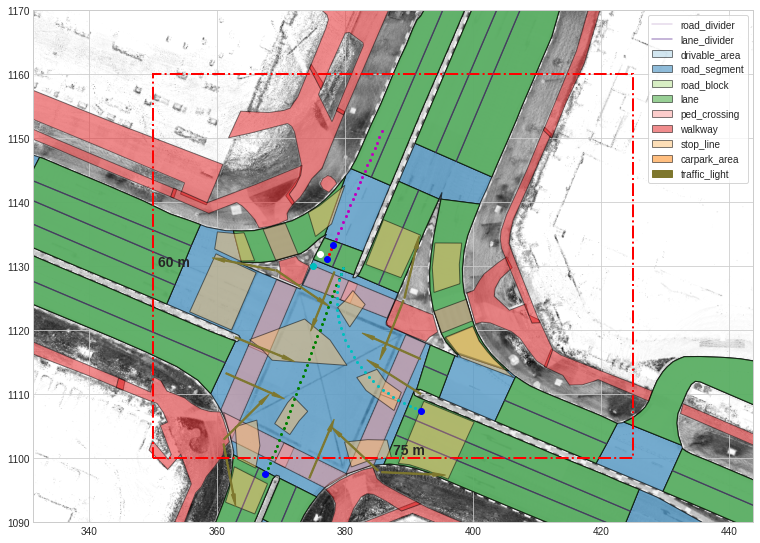

In [214]:
my_patch = (350, 1100, 425, 1160)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=775
#past_y=760
#now_x=774
#now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=1)
print(lanes)
direct_tensor = None
for i,lane in enumerate(hello):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

In [215]:
nearest_3_lane=get_nearest_3_lane_hello(hello,point,1)
print(nearest_3_lane)

lane: fea4c05c-c4ce-499d-8bd9-9070f080eb70
num: 9.648377303111829
lane: c119fed8-400d-486a-93a0-6738464a3680
num: 9.648377303111602
d6f48dbf-3377-4e3a-9d1d-36c6dce63600
nearst_lane: ['fea4c05c-c4ce-499d-8bd9-9070f080eb70', 'd6f48dbf-3377-4e3a-9d1d-36c6dce63600']
['fea4c05c-c4ce-499d-8bd9-9070f080eb70', 'd6f48dbf-3377-4e3a-9d1d-36c6dce63600']


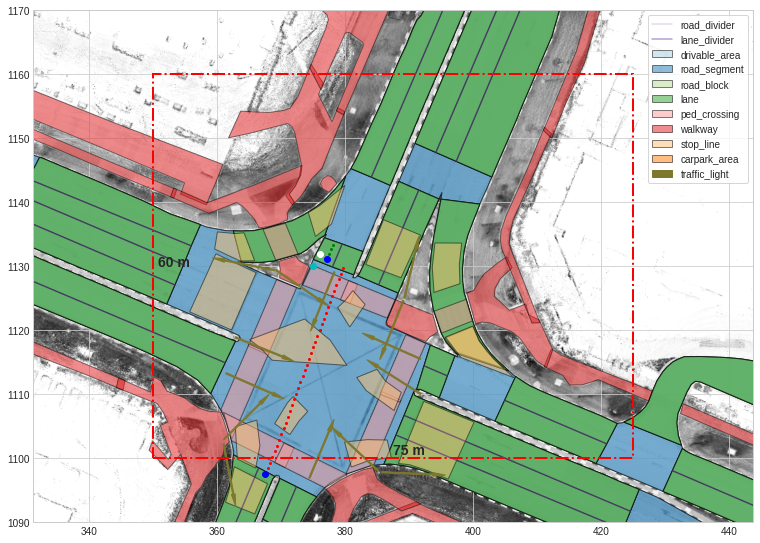

In [216]:
my_patch = (350, 1100, 425, 1160)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=490
#past_y=1365
#now_x=492
#now_y=1368

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=1)
#print(lanes)
direct_tensor = None
for i,lane in enumerate(nearest_3_lane):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

第五個場景測試：

當前point(775,1710)

前一point(777,1708)

['1d33cc75-5fa8-462a-9fa1-dc30964d4ce8', '62fc342c-63c4-49c8-9b60-68f539783614', 'f0b4d6d7-b96f-4eab-8f8b-c2deb5693c96', 'bf74bb69-3bad-4647-b31e-e2384c93ae14', 'df93dccf-22e0-4df0-a661-bd87ef4e261c', 'f66befa7-8167-455f-9674-fb9f0ebfea50', '3faae508-d43d-4817-b1b9-06ebf575e3cf']


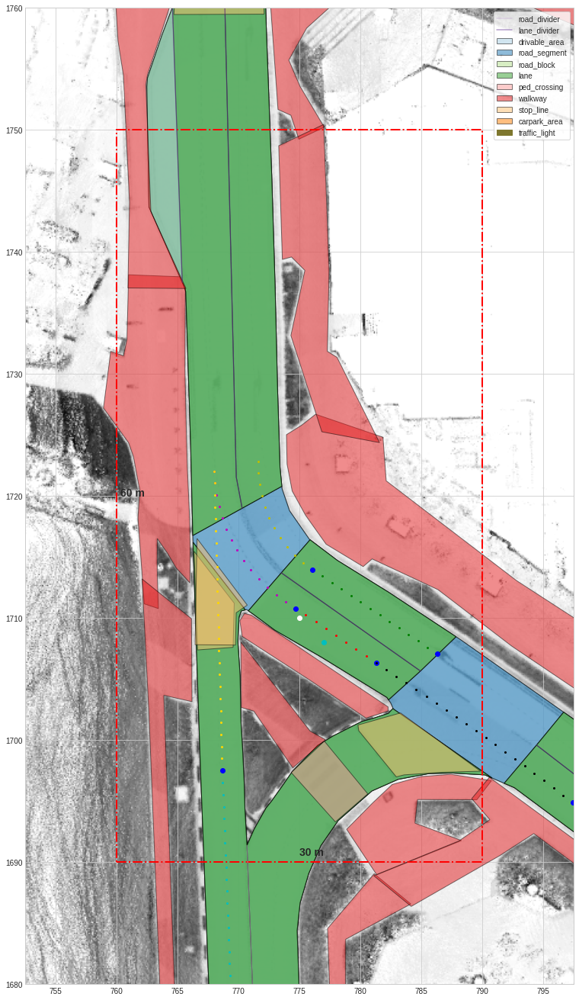

In [174]:
my_patch = (760, 1690, 790 , 1750)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

past_x=777
past_y=1708
now_x=775
now_y=1710

color = ['r','g','c','m','y','k','gold','lime','b']
lanes = get_around_lane(now_x,now_y, radius=5)
print(lanes)
direct_tensor = None
for i,lane in enumerate(lanes):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(past_x, past_y,'co') #青色實心(前一幀)          
ax.plot(now_x, now_y,'wo') #白色實心(現在)

In [19]:
point = np.zeros(shape=(2,2))
##當前point
point[0,0]=775
point[0,1]=1710
##前一個point
point[1,0]=777
point[1,1]=1708
point

array([[ 775., 1710.],
       [ 777., 1708.]])

In [20]:
same_dir_lane=get_same_direction_of_point(point,5)
print(same_dir_lane)

lane: 1d33cc75-5fa8-462a-9fa1-dc30964d4ce8
inner_product: 0.9814973338804271
angle: 11.038922980441901
lane: 62fc342c-63c4-49c8-9b60-68f539783614
inner_product: 0.9816528452184806
angle: 10.992291662343389
lane: f0b4d6d7-b96f-4eab-8f8b-c2deb5693c96
inner_product: 0.7332039273518905
angle: 42.84433259728701
lane: bf74bb69-3bad-4647-b31e-e2384c93ae14
inner_product: 0.9814991644114024
angle: 11.038375212698716
lane: df93dccf-22e0-4df0-a661-bd87ef4e261c
inner_product: 0.9986620412383693
angle: 2.96419949127063
lane: f66befa7-8167-455f-9674-fb9f0ebfea50
inner_product: 0.9814980609246521
angle: 11.038705423079042
lane: 3faae508-d43d-4817-b1b9-06ebf575e3cf
inner_product: 0.7258667922731482
angle: 43.45899743300716
['1d33cc75-5fa8-462a-9fa1-dc30964d4ce8', '62fc342c-63c4-49c8-9b60-68f539783614', 'f0b4d6d7-b96f-4eab-8f8b-c2deb5693c96', 'bf74bb69-3bad-4647-b31e-e2384c93ae14', 'df93dccf-22e0-4df0-a661-bd87ef4e261c', 'f66befa7-8167-455f-9674-fb9f0ebfea50', '3faae508-d43d-4817-b1b9-06ebf575e3cf']


In [136]:
hello=delt_past_lane(same_dir_lane,point,5)
print(hello)

['1d33cc75-5fa8-462a-9fa1-dc30964d4ce8', '62fc342c-63c4-49c8-9b60-68f539783614', 'bf74bb69-3bad-4647-b31e-e2384c93ae14', 'df93dccf-22e0-4df0-a661-bd87ef4e261c', '3faae508-d43d-4817-b1b9-06ebf575e3cf']


['1d33cc75-5fa8-462a-9fa1-dc30964d4ce8', '62fc342c-63c4-49c8-9b60-68f539783614', 'f0b4d6d7-b96f-4eab-8f8b-c2deb5693c96', 'bf74bb69-3bad-4647-b31e-e2384c93ae14', 'df93dccf-22e0-4df0-a661-bd87ef4e261c', 'f66befa7-8167-455f-9674-fb9f0ebfea50', '3faae508-d43d-4817-b1b9-06ebf575e3cf']


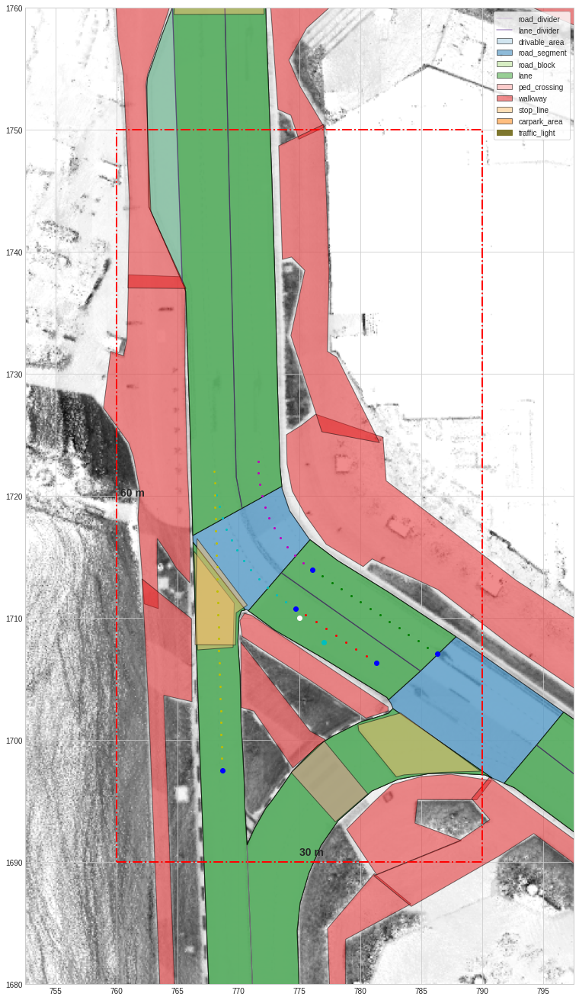

In [10]:
my_patch = (760, 1690, 790 , 1750)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=775
#past_y=760
#now_x=774
#now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=5)
print(lanes)
direct_tensor = None
for i,lane in enumerate(hello):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)

In [137]:
nearest_3_lane=get_nearest_3_lane_hello(hello,point,5)
print(nearest_3_lane)

lane: 62fc342c-63c4-49c8-9b60-68f539783614
num: -5.035522285345451
lane: df93dccf-22e0-4df0-a661-bd87ef4e261c
num: -4.8431610989803175
lane: 3faae508-d43d-4817-b1b9-06ebf575e3cf
num: 6.417873698603216
1d33cc75-5fa8-462a-9fa1-dc30964d4ce8
nearst_lane: ['3faae508-d43d-4817-b1b9-06ebf575e3cf', '1d33cc75-5fa8-462a-9fa1-dc30964d4ce8', '62fc342c-63c4-49c8-9b60-68f539783614']
['3faae508-d43d-4817-b1b9-06ebf575e3cf', '1d33cc75-5fa8-462a-9fa1-dc30964d4ce8', '62fc342c-63c4-49c8-9b60-68f539783614']


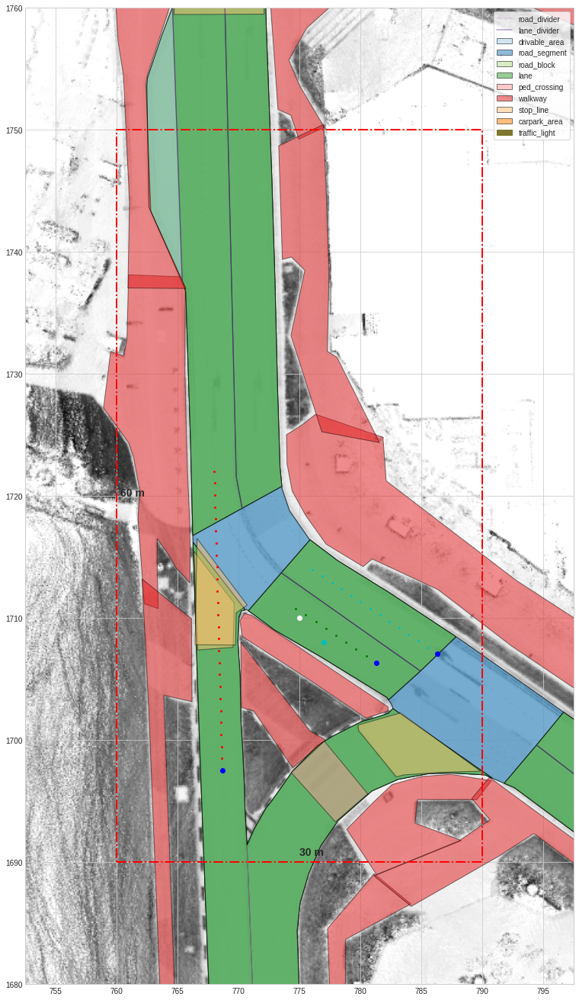

In [138]:
my_patch = (760, 1690, 790 , 1750)
fig, ax = nusc_map.render_map_patch(my_patch, nusc_map.non_geometric_layers, figsize=(10, 10), bitmap=bitmap)

#past_x=775
#past_y=760
#now_x=774
#now_y=764

color = ['r','g','c','m','y','k','gold','lime']
lanes = get_around_lane(point[0,0], point[0,1], radius=5)
#print(lanes)
direct_tensor = None
for i,lane in enumerate(nearest_3_lane):
    lane_record = nusc_map.get_arcline_path(lane)
    poses = arcline_path_utils.discretize_lane(lane_record, resolution_meters=1)
    direct_tensor = tuple(map(lambda i, j: i - j, poses[0], poses[1])) # 方向向量
    clr = color[i]
    for j,pose in enumerate(poses):
        if not j :
            ax.plot(pose[0],pose[1],'bo') # start_pose
        else:
            ax.plot(pose[0],pose[1],c=clr,marker='o',markersize=2) # remain_pose
            
ax.plot(point[1,0], point[1,1],'co') #青色實心(前一幀)          
ax.plot(point[0,0], point[0,1],'wo') #白色實心(現在)